In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df=pd.read_csv('rideshare_kaggle.csv')
df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [3]:
df.columns

Index(['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone',
       'source', 'destination', 'cab_type', 'product_id', 'name', 'price',
       'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparentTemperature', 'short_summary', 'long_summary',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperat

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [5]:
df.describe()

,timestamp,hour,day,month,price,distance,surge_multiplier,latitude,longitude,temperature,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.930710e+05,693071.000000,693071.000000,693071.000000,637976.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,...,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05
mean,1.544046e+09,11.619137,17.794365,11.586684,16.545125,2.189430,1.013870,42.338172,-71.066151,39.584388,...,0.037374,1.544044e+09,33.457774,1.544042e+09,45.261313,1.544047e+09,29.731002,1.544048e+09,41.997343,1.544048e+09
std,6.891925e+05,6.948114,9.982286,0.492429,9.324359,1.138937,0.091641,0.047840,0.020302,6.726084,...,0.055214,6.912028e+05,6.467224,6.901954e+05,5.645046,6.901353e+05,7.110494,6.871862e+05,6.936841,6.910777e+05
min,1.543204e+09,0.000000,1.000000,11.000000,2.500000,0.020000,1.000000,42.214800,-71.105400,18.910000,...,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,9.000000,1.280000,1.000000,42.350300,-71.081000,36.450000,...,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,13.500000,2.160000,1.000000,42.351900,-71.063100,40.490000,...,0.000400,1.543770e+09,34.240000,1.543727e+09,44.680000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,22.500000,2.920000,1.000000,42.364700,-71.054200,43.580000,...,0.091600,1.544807e+09,38.880000,1.544789e+09,46.910000,1.544814e+09,35.710000,1.544789e+09,44.120000,1.544818e+09
max,1.545161e+09,23.000000,30.000000,12.000000,97.500000,7.860000,3.000000,42.366100,-71.033000,57.220000,...,0.145900,1.545152e+09,43.100000,1.545192e+09,57.870000,1.545109e+09,40.050000,1.545134e+09,57.200000,1.545109e+09


## Data Cleaning

In [6]:
df.duplicated().nunique()

1

In [7]:
df.isnull().sum()

id                                 0
timestamp                          0
hour                               0
day                                0
month                              0
datetime                           0
timezone                           0
source                             0
destination                        0
cab_type                           0
product_id                         0
name                               0
price                          55095
distance                           0
surge_multiplier                   0
latitude                           0
longitude                          0
temperature                        0
apparentTemperature                0
short_summary                      0
long_summary                       0
precipIntensity                    0
precipProbability                  0
humidity                           0
windSpeed                          0
windGust                           0
windGustTime                       0
v

In [8]:
df.isnull().sum()/len(df) * 100

id                             0.000000
timestamp                      0.000000
hour                           0.000000
day                            0.000000
month                          0.000000
datetime                       0.000000
timezone                       0.000000
source                         0.000000
destination                    0.000000
cab_type                       0.000000
product_id                     0.000000
name                           0.000000
price                          7.949402
distance                       0.000000
surge_multiplier               0.000000
latitude                       0.000000
longitude                      0.000000
temperature                    0.000000
apparentTemperature            0.000000
short_summary                  0.000000
long_summary                   0.000000
precipIntensity                0.000000
precipProbability              0.000000
humidity                       0.000000
windSpeed                      0.000000


In [9]:
df.dropna(inplace=True)

In [10]:
df.isnull().sum()

id                             0
timestamp                      0
hour                           0
day                            0
month                          0
datetime                       0
timezone                       0
source                         0
destination                    0
cab_type                       0
product_id                     0
name                           0
price                          0
distance                       0
surge_multiplier               0
latitude                       0
longitude                      0
temperature                    0
apparentTemperature            0
short_summary                  0
long_summary                   0
precipIntensity                0
precipProbability              0
humidity                       0
windSpeed                      0
windGust                       0
windGustTime                   0
visibility                     0
temperatureHigh                0
temperatureHighTime            0
temperatur

In [11]:
len(df.price) == len(df)

True

In [12]:
df.nunique()

id                             637976
timestamp                       35796
hour                               24
day                                17
month                               2
datetime                        31350
timezone                            1
source                             12
destination                        12
cab_type                            2
product_id                         12
name                               12
price                             147
distance                          549
surge_multiplier                    7
latitude                           11
longitude                          12
temperature                       308
apparentTemperature               319
short_summary                       9
long_summary                       11
precipIntensity                    63
precipProbability                  29
humidity                           51
windSpeed                         291
windGust                          286
windGustTime

## Exploratory Data Analysis

In [13]:
df.name.unique()

array(['Shared', 'Lux', 'Lyft', 'Lux Black XL', 'Lyft XL', 'Lux Black',
       'UberXL', 'Black', 'UberX', 'WAV', 'Black SUV', 'UberPool'],
      dtype=object)

In [14]:
df.cab_type.unique()

array(['Lyft', 'Uber'], dtype=object)

In [15]:
df.groupby(['cab_type','name'])['price'].sum()

cab_type  name        
Lyft      Lux              910509.50
          Lux Black       1181605.55
          Lux Black XL    1656124.55
          Lyft             492413.68
          Lyft XL          784375.20
          Shared           308929.50
Uber      Black           1130758.00
          Black SUV       1668679.50
          UberPool         482184.00
          UberX            537997.00
          UberXL           863803.00
          WAV              538013.50
Name: price, dtype: float64

In [16]:
df['cab_type'].value_counts()

Uber    330568
Lyft    307408
Name: cab_type, dtype: int64

In [17]:
df['name'].value_counts()

UberXL          55096
WAV             55096
Black SUV       55096
Black           55095
UberX           55094
UberPool        55091
Lux             51235
Lyft            51235
Lux Black XL    51235
Lyft XL         51235
Lux Black       51235
Shared          51233
Name: name, dtype: int64

In [18]:
df.groupby(['cab_type','name'])['distance'].sum()

cab_type  name        
Lyft      Lux             112049.32
          Lux Black       112049.32
          Lux Black XL    112049.32
          Lyft            112049.32
          Lyft XL         112049.32
          Shared          112047.19
Uber      Black           120735.12
          Black SUV       120736.15
          UberPool        120726.22
          UberX           120732.46
          UberXL          120736.15
          WAV             120736.15
Name: distance, dtype: float64

In [19]:
df.groupby(['cab_type'])['distance'].sum()

cab_type
Lyft    672293.79
Uber    724402.25
Name: distance, dtype: float64

In [20]:
#total price of company
df.groupby(['cab_type'])['price'].sum()

cab_type
Lyft    5333957.98
Uber    5221435.00
Name: price, dtype: float64

In [21]:
df[['distance','price','datetime']].describe()

,distance,price
count,637976.000000,637976.000000
mean,2.189261,16.545125
std,1.135413,9.324359
min,0.020000,2.500000
25%,1.270000,9.000000
50%,2.160000,13.500000
75%,2.930000,22.500000
max,7.860000,97.500000


In [22]:
df.datetime.min()

'2018-11-26 03:40:46'

In [23]:
df.datetime.max()

'2018-12-18 19:15:10'

In [24]:
categorical = df.select_dtypes(include=object).columns
categorical

Index(['id', 'datetime', 'timezone', 'source', 'destination', 'cab_type',
       'product_id', 'name', 'short_summary', 'long_summary', 'icon'],
      dtype='object')

In [25]:
numerical = []
for x in df.columns:
    if x not in categorical:
        numerical.append(x)

In [26]:
numerical

['timestamp',
 'hour',
 'day',
 'month',
 'price',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']

In [27]:
features = []

In [28]:
import seaborn as sns

<AxesSubplot:title={'center':'Day'}, xlabel='hour', ylabel='count'>

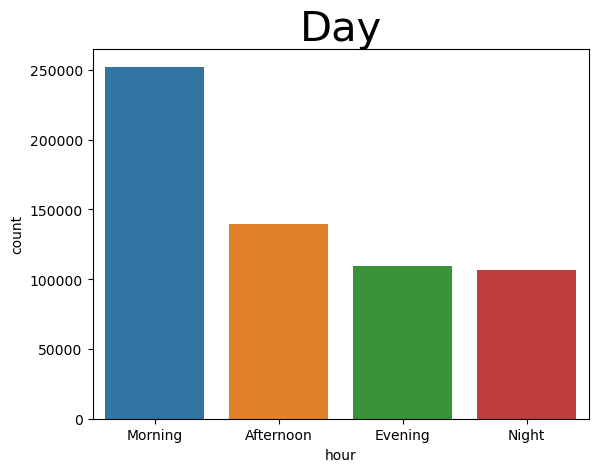

In [29]:
#Number of rides during the parts of the day
day=pd.cut(x=df['hour'],bins=[0,10,15,19,23],labels = ['Morning','Afternoon','Evening','Night'])
plt.title('Day',fontsize=30)
sns.countplot(x=day)

In [30]:
df['daytime'] = day

In [31]:
df.daytime


0         Morning
1         Morning
2         Morning
3         Morning
4         Morning
           ...   
693065      Night
693066      Night
693067      Night
693069      Night
693070      Night
Name: daytime, Length: 637976, dtype: category
Categories (4, object): ['Morning' < 'Afternoon' < 'Evening' < 'Night']

### Plotting categorical columns

In [32]:
categorical

Index(['id', 'datetime', 'timezone', 'source', 'destination', 'cab_type',
       'product_id', 'name', 'short_summary', 'long_summary', 'icon'],
      dtype='object')

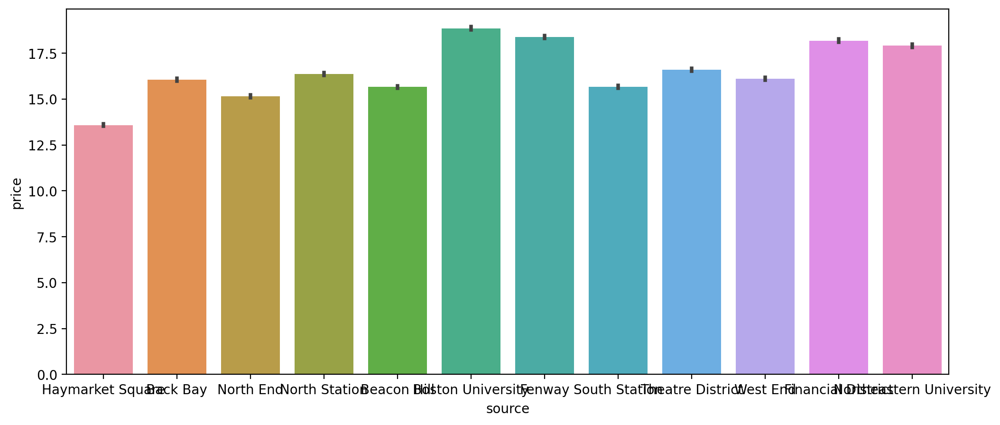

add?: y


In [33]:
x = 'source'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

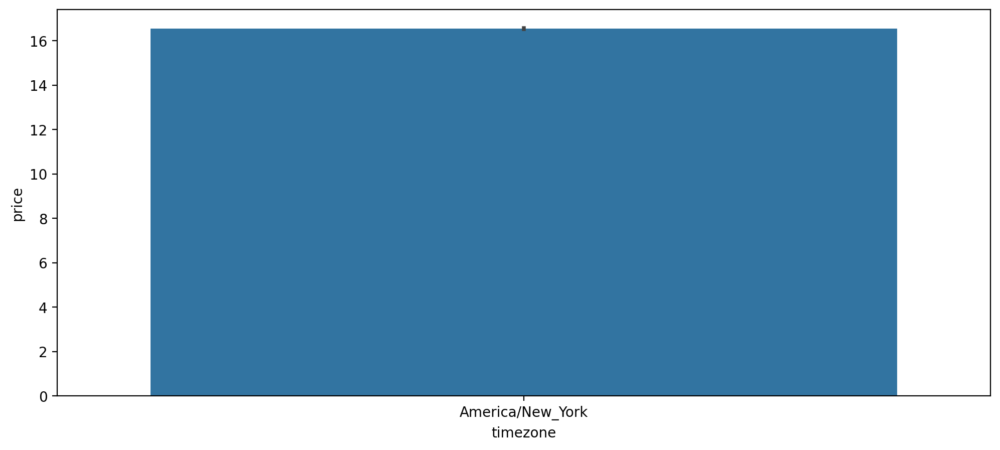

add?: y


In [34]:
x = 'timezone'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

In [35]:
df.timezone.nunique()

1

In [36]:
categorical

Index(['id', 'datetime', 'timezone', 'source', 'destination', 'cab_type',
       'product_id', 'name', 'short_summary', 'long_summary', 'icon'],
      dtype='object')

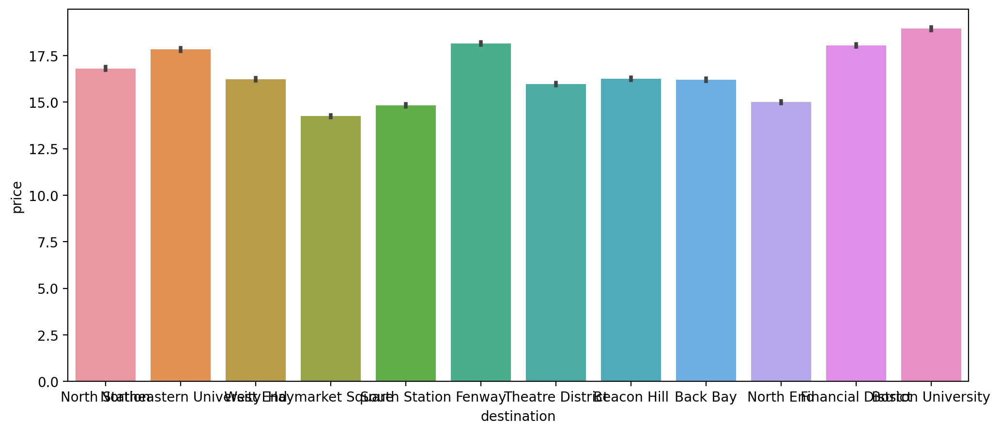

add?: y


In [37]:
x = 'destination'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

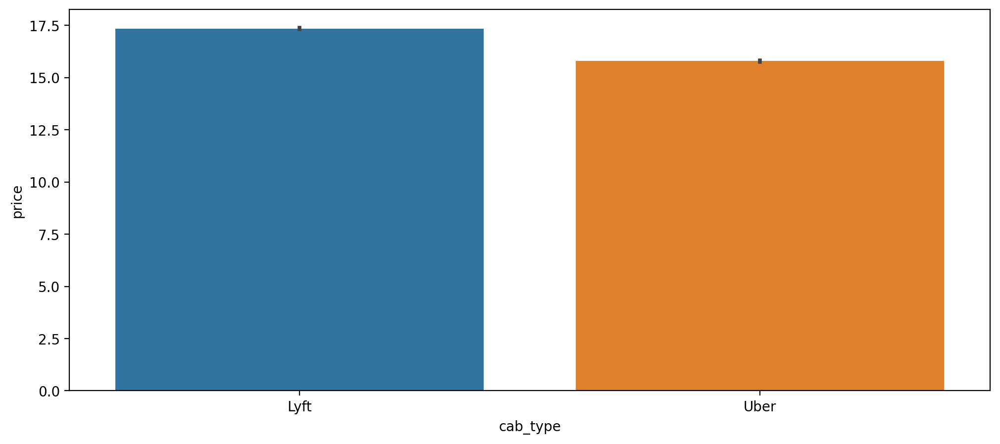

add?: y


In [38]:
x = 'cab_type'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

In [39]:
features

['source', 'timezone', 'destination', 'cab_type']

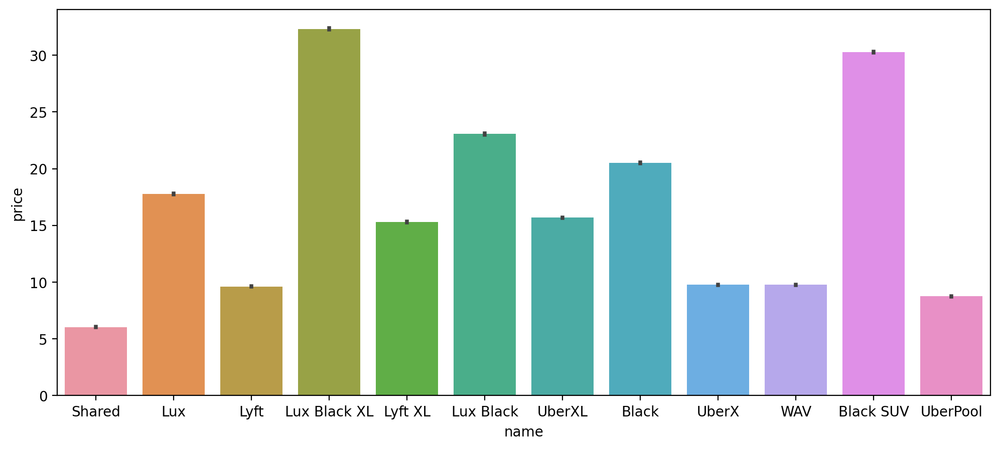

add?: y


In [40]:
x = 'name'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

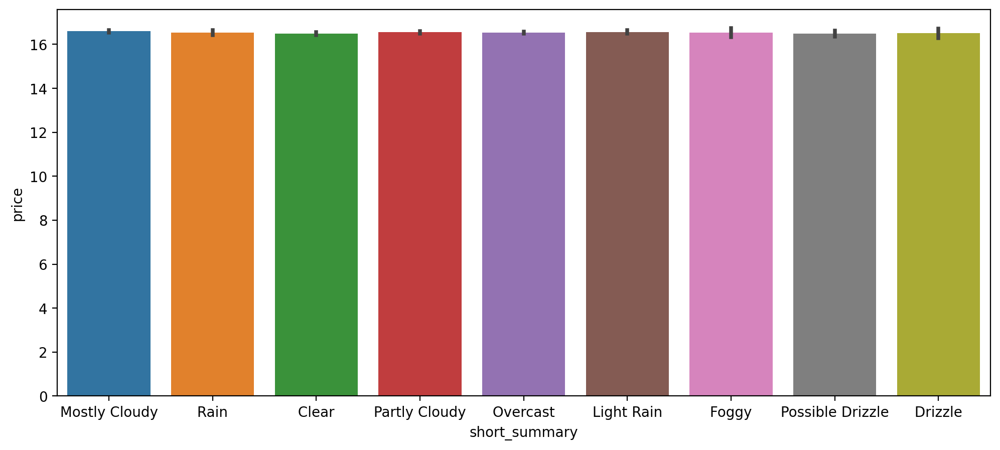

add?: y


In [41]:
x = 'short_summary'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

In [42]:
df.short_summary.value_counts()

 Overcast             201429
 Mostly Cloudy        134603
 Partly Cloudy        117226
 Clear                 80256
 Light Rain            50488
 Rain                  21781
 Possible Drizzle      17176
 Foggy                  8292
 Drizzle                6725
Name: short_summary, dtype: int64

In [43]:
features.append('short_summary')

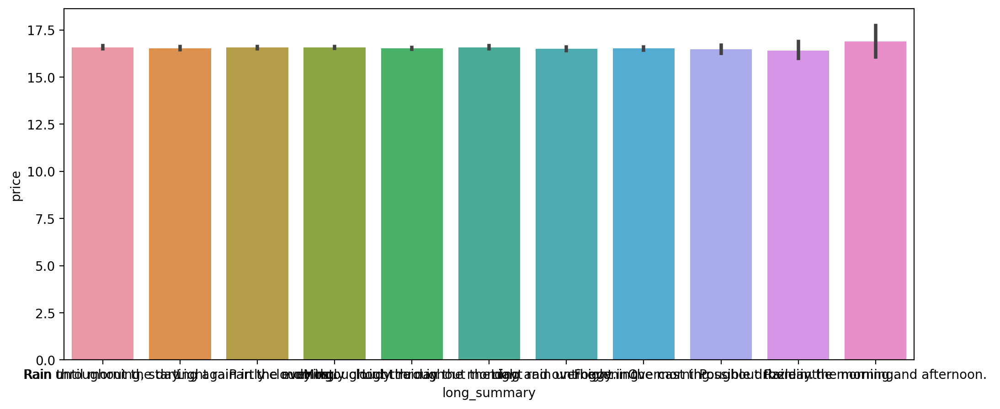

add?: y


In [44]:
x = 'long_summary'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

In [45]:
df.long_summary.unique()

array([' Rain throughout the day. ',
       ' Rain until morning, starting again in the evening. ',
       ' Light rain in the morning. ',
       ' Partly cloudy throughout the day. ',
       ' Mostly cloudy throughout the day. ',
       ' Light rain in the morning and overnight. ',
       ' Light rain until evening. ', ' Foggy in the morning. ',
       ' Overcast throughout the day. ',
       ' Possible drizzle in the morning. ',
       ' Rain in the morning and afternoon. '], dtype=object)

In [46]:
features.append('long_summary')

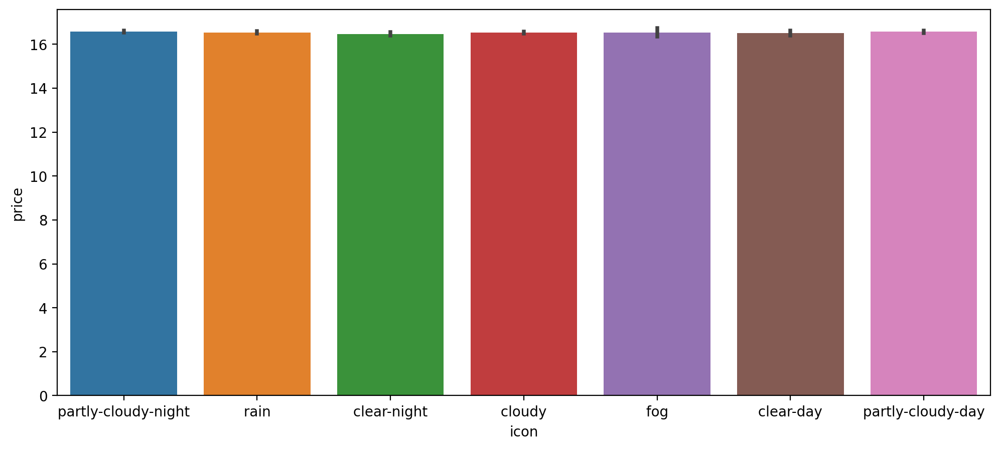

add?: y


In [47]:
x = 'icon'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data = df)
plt.show()
c = input("add?: ")
if c == 'y':
    features.append(x)

In [48]:
df.short_summary.value_counts(),df.long_summary.value_counts(),df.icon.value_counts()

( Overcast             201429
  Mostly Cloudy        134603
  Partly Cloudy        117226
  Clear                 80256
  Light Rain            50488
  Rain                  21781
  Possible Drizzle      17176
  Foggy                  8292
  Drizzle                6725
 Name: short_summary, dtype: int64,
  Mostly cloudy throughout the day.                      186262
  Partly cloudy throughout the day.                      133744
  Light rain in the morning.                              94423
  Rain throughout the day.                                49929
  Light rain in the morning and overnight.                46575
  Rain until morning, starting again in the evening.      44071
  Foggy in the morning.                                   41201
  Light rain until evening.                               32690
  Overcast throughout the day.                             6906
  Possible drizzle in the morning.                         1708
  Rain in the morning and afternoon.                  

In [49]:
features.append('icon')

In [50]:
features

['source',
 'timezone',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'short_summary',
 'long_summary',
 'long_summary',
 'icon',
 'icon']

### Numerical Columns

In [51]:
numerical

['timestamp',
 'hour',
 'day',
 'month',
 'price',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']

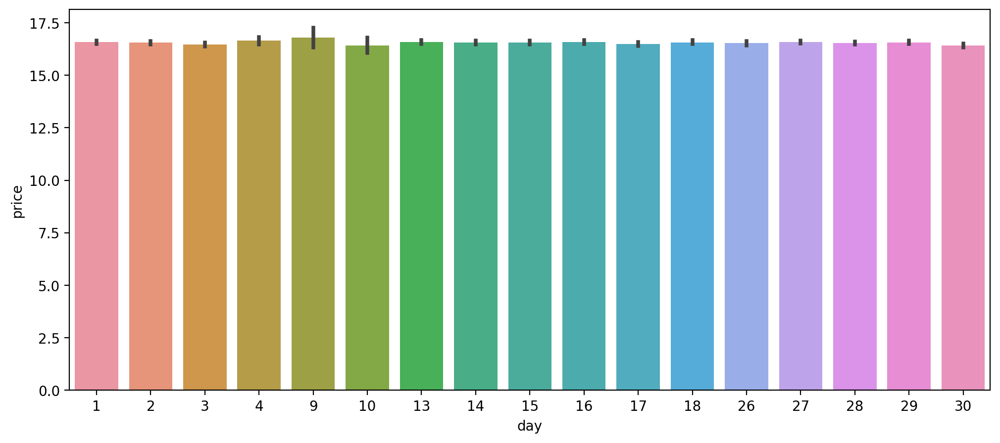

add? : y


In [52]:
x = 'day'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data=df)
plt.show()
c = input('add? : ')
if c == 'y':
    features.append(x)

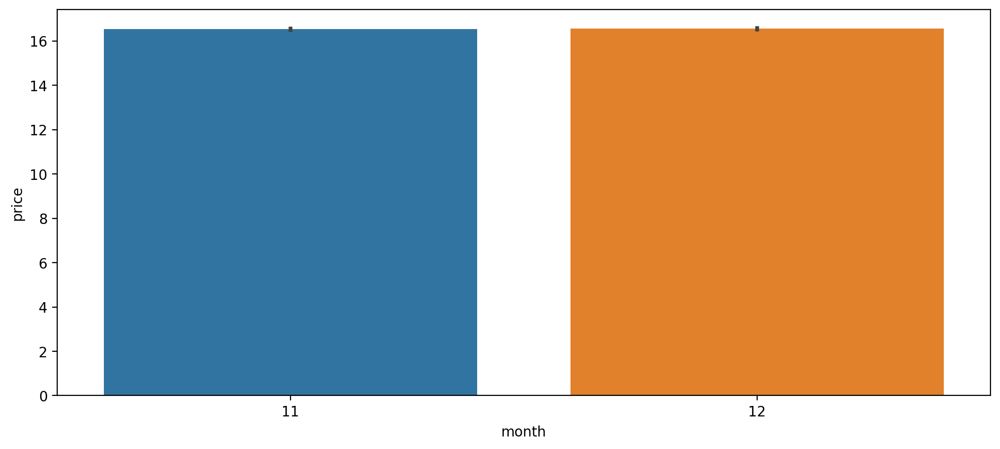

add? : y


In [53]:
x = 'month'
plt.figure(figsize = (12,5), dpi = 200 )
sns.barplot(x=x, y='price', data=df)
plt.show()
c = input('add? : ')
if c == 'y':
    features.append(x)

In [54]:
df.month.nunique()

2

In [55]:
df.month.value_counts()

12    374205
11    263771
Name: month, dtype: int64

In [56]:
df.groupby(['month'])['price'].sum()

month
11    4361448.35
12    6193944.63
Name: price, dtype: float64

In [57]:
features.append('month')

In [58]:
features

['source',
 'timezone',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'short_summary',
 'long_summary',
 'long_summary',
 'icon',
 'icon',
 'day',
 'month',
 'month']

In [59]:
numerical

['timestamp',
 'hour',
 'day',
 'month',
 'price',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']

/var/folders/bq/_63515l56bbcxdr7gvzr_m740000gn/T/ipykernel_8770/3933963854.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (12,5), dpi = 200 )


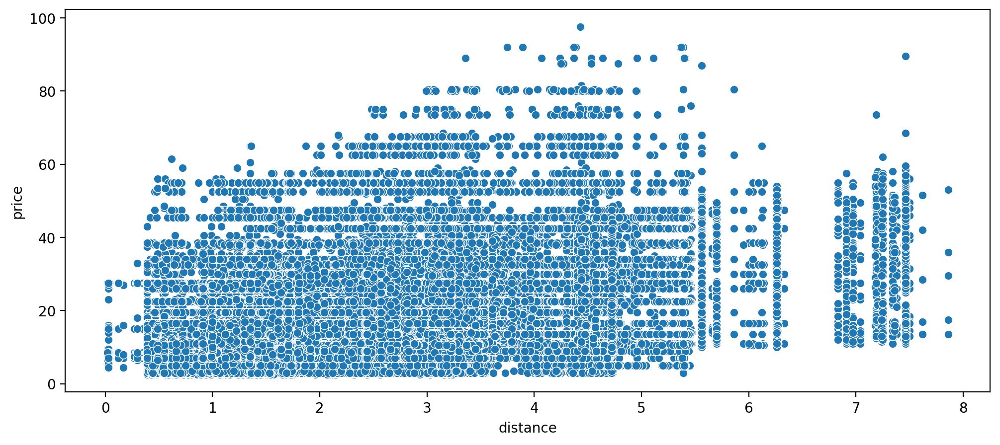

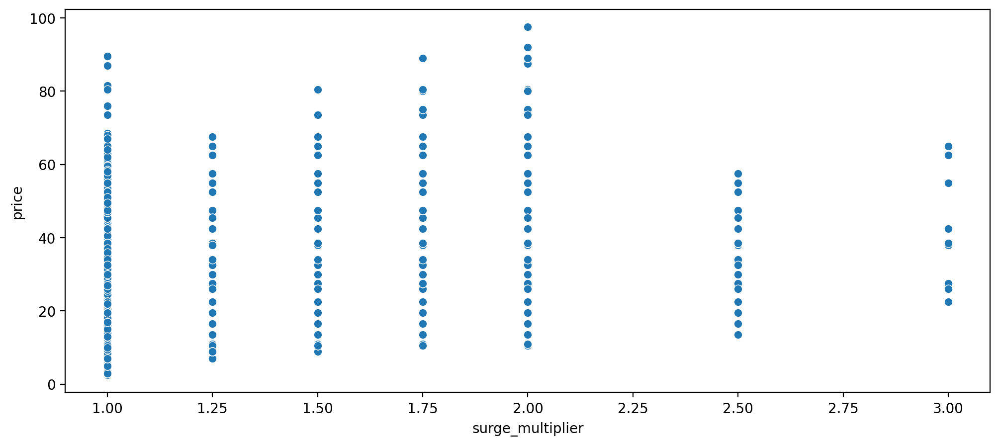

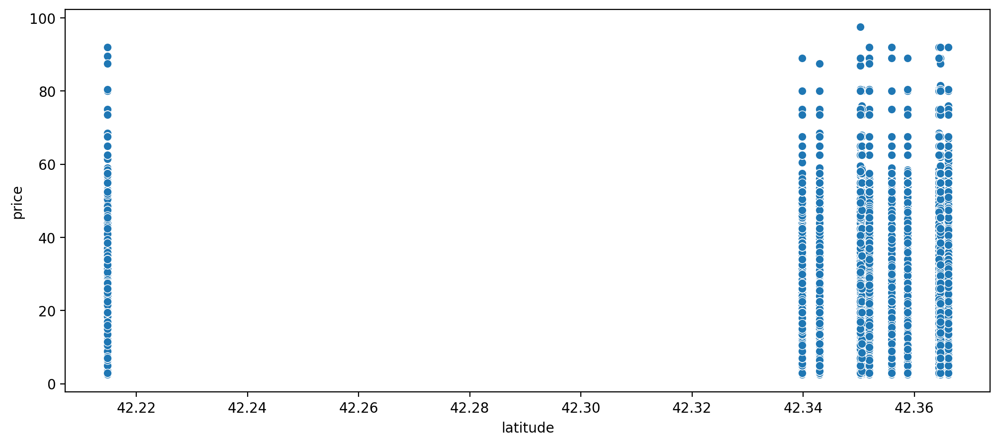

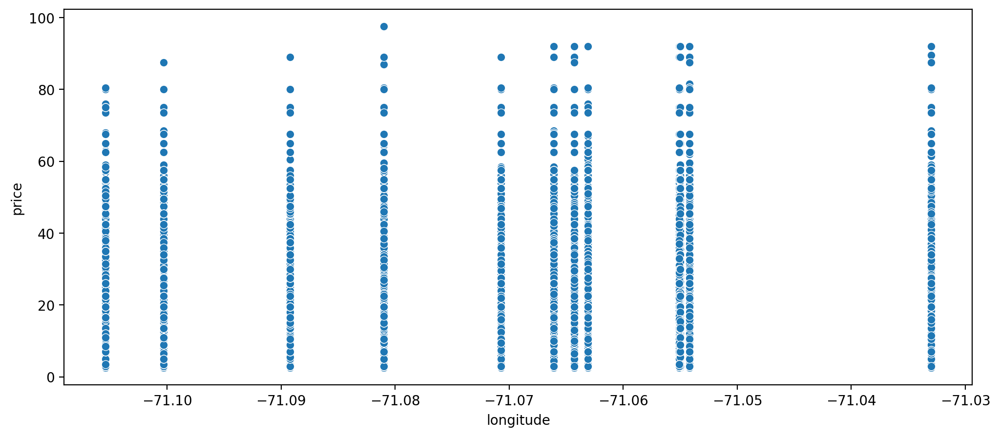

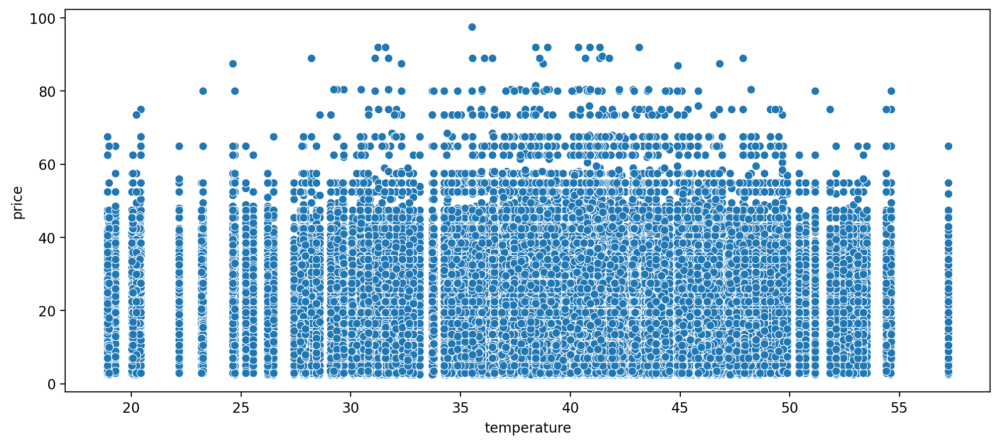

...

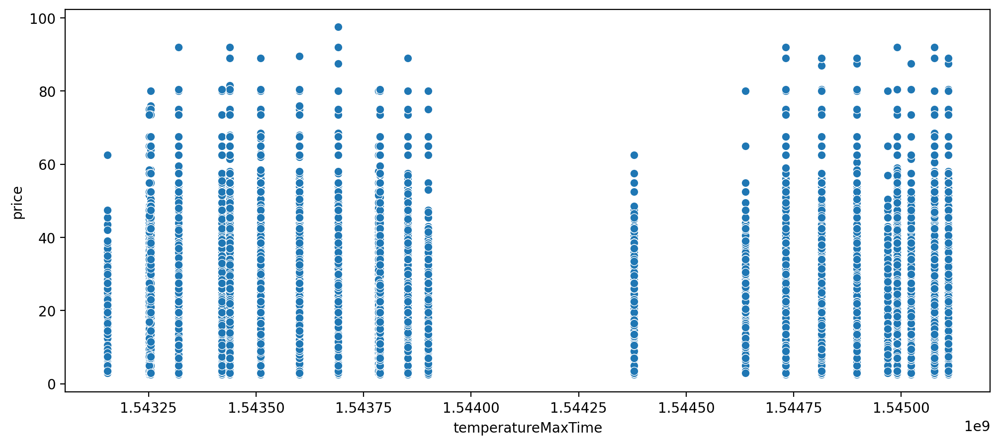

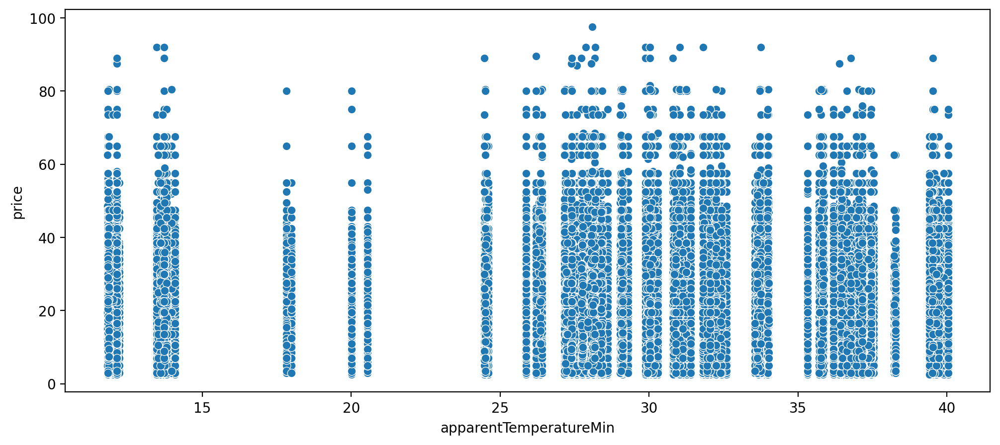

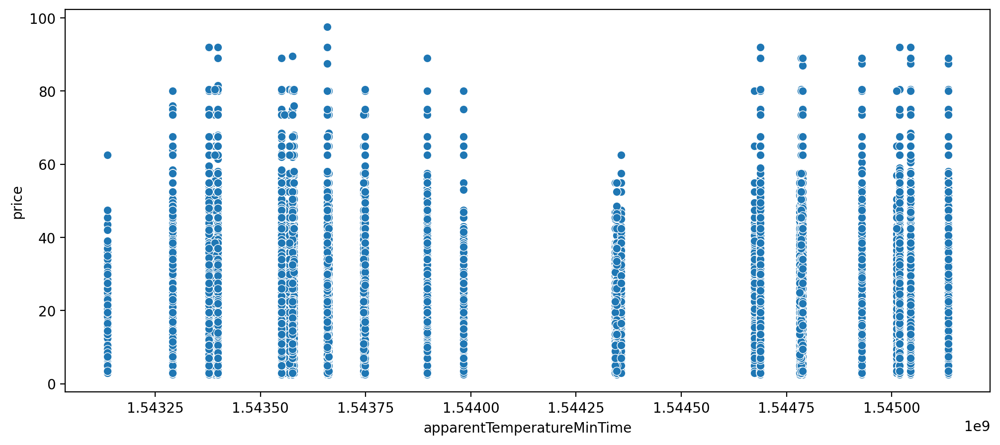

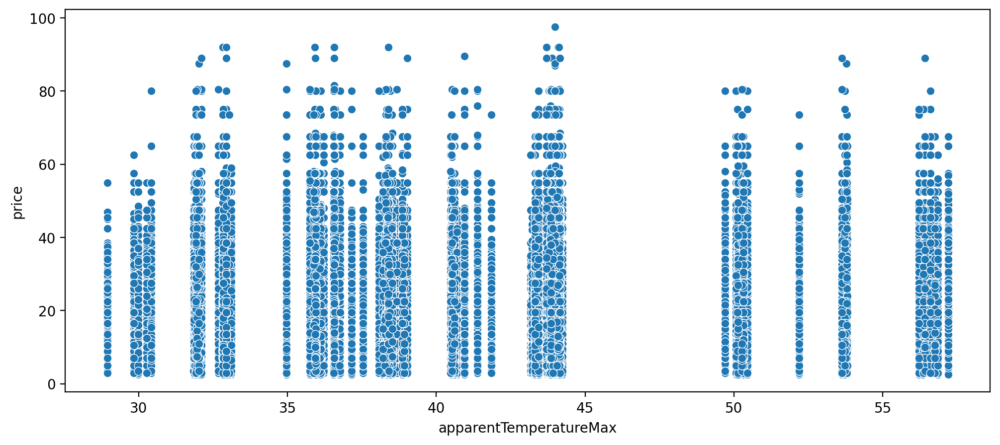

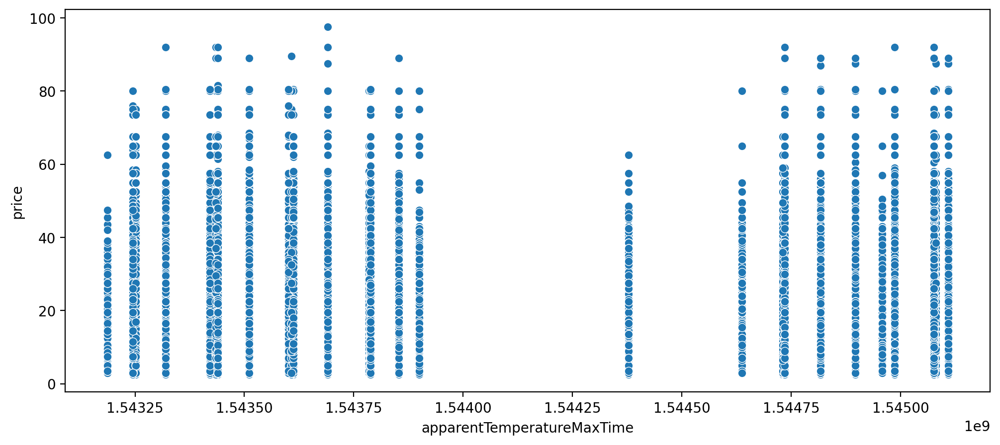

In [60]:
for x in ['distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']:
    plt.figure(figsize = (12,5), dpi = 200 )
    sns.scatterplot(x=x, y='price', data=df)
    

In [61]:
features.extend(['distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime'])

In [62]:
features

['source',
 'timezone',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'short_summary',
 'long_summary',
 'long_summary',
 'icon',
 'icon',
 'day',
 'month',
 'month',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']

### Datetime features

<AxesSubplot:title={'center':'Hours of day'}, xlabel='hour', ylabel='Count'>

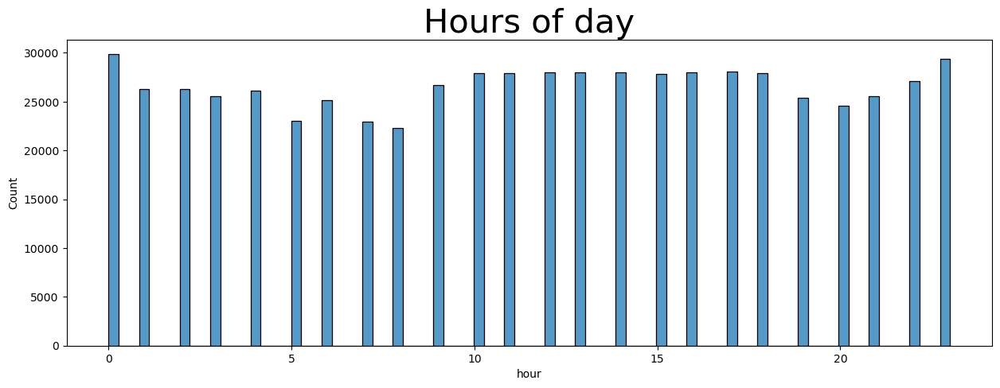

In [63]:
plt.figure(figsize=(15,5))
plt.title('Hours of day',fontsize=30)
sns.histplot(x='hour',data=df)

In [64]:
features

['source',
 'timezone',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'short_summary',
 'long_summary',
 'long_summary',
 'icon',
 'icon',
 'day',
 'month',
 'month',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime']

In [65]:
features.append('hour')

<AxesSubplot:title={'center':'Days of month'}, xlabel='day', ylabel='Count'>

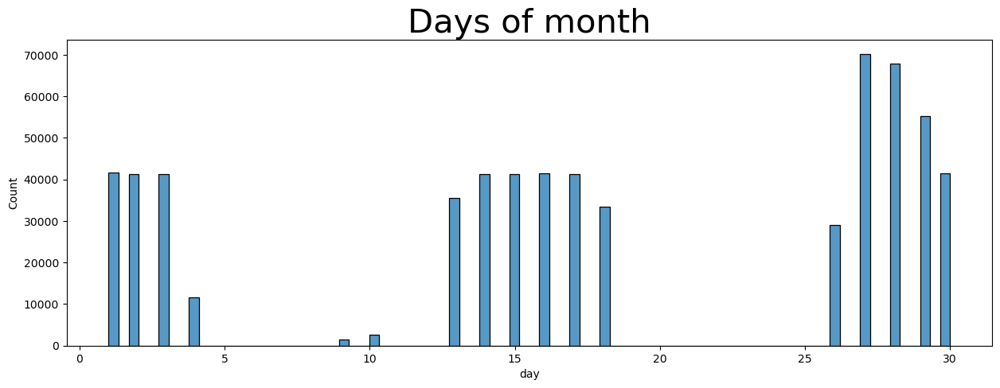

In [66]:
plt.figure(figsize=(15,5))
plt.title('Days of month',fontsize=30)
sns.histplot(x='day',data=df)

In [67]:
features

['source',
 'timezone',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'short_summary',
 'long_summary',
 'long_summary',
 'icon',
 'icon',
 'day',
 'month',
 'month',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'temperature',
 'apparentTemperature',
 'precipIntensity',
 'precipProbability',
 'humidity',
 'windSpeed',
 'windGust',
 'windGustTime',
 'visibility',
 'temperatureHigh',
 'temperatureHighTime',
 'temperatureLow',
 'temperatureLowTime',
 'apparentTemperatureHigh',
 'apparentTemperatureHighTime',
 'apparentTemperatureLow',
 'apparentTemperatureLowTime',
 'dewPoint',
 'pressure',
 'windBearing',
 'cloudCover',
 'uvIndex',
 'visibility.1',
 'ozone',
 'sunriseTime',
 'sunsetTime',
 'moonPhase',
 'precipIntensityMax',
 'uvIndexTime',
 'temperatureMin',
 'temperatureMinTime',
 'temperatureMax',
 'temperatureMaxTime',
 'apparentTemperatureMin',
 'apparentTemperatureMinTime',
 'apparentTemperatureMax',
 'apparentTemperatureMaxTime',
 'hour']

In [68]:
features = pd.DataFrame(features)

In [69]:
features[0].unique()

array(['source', 'timezone', 'destination', 'cab_type', 'name',
       'short_summary', 'long_summary', 'icon', 'day', 'month',
       'distance', 'surge_multiplier', 'latitude', 'longitude',
       'temperature', 'apparentTemperature', 'precipIntensity',
       'precipProbability', 'humidity', 'windSpeed', 'windGust',
       'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'dewPoint',
       'pressure', 'windBearing', 'cloudCover', 'uvIndex', 'visibility.1',
       'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperatureMax', 'apparentTemperatureMaxTime', 'hour'],
      dtype=ob

In [70]:
df.columns

Index(['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone',
       'source', 'destination', 'cab_type', 'product_id', 'name', 'price',
       'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparentTemperature', 'short_summary', 'long_summary',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperat

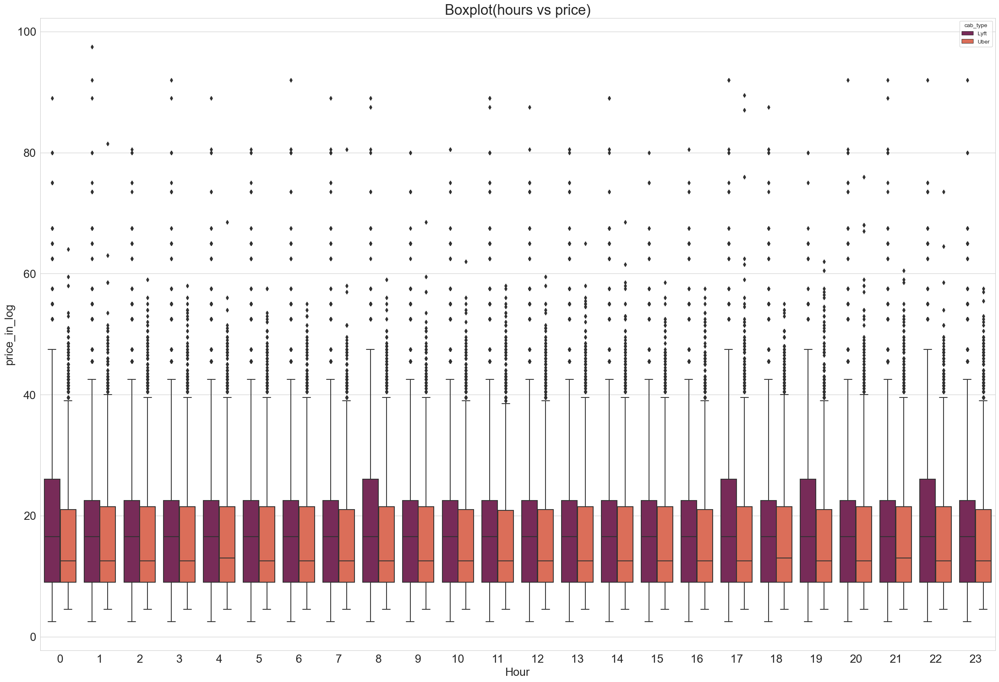

In [71]:
plt.figure(figsize=(30,20))
sns.set_style("whitegrid")
sns.boxplot(x="hour", y="price",data=df, hue="cab_type",palette="rocket")
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 20)
plt.xlabel("Hour",fontsize=20)
plt.ylabel("price_in_log",fontsize=20)
plt.title("Boxplot(hours vs price)",fontsize=25)
plt.show()

<AxesSubplot:title={'center':'Uber and Lyft Heat Map'}>

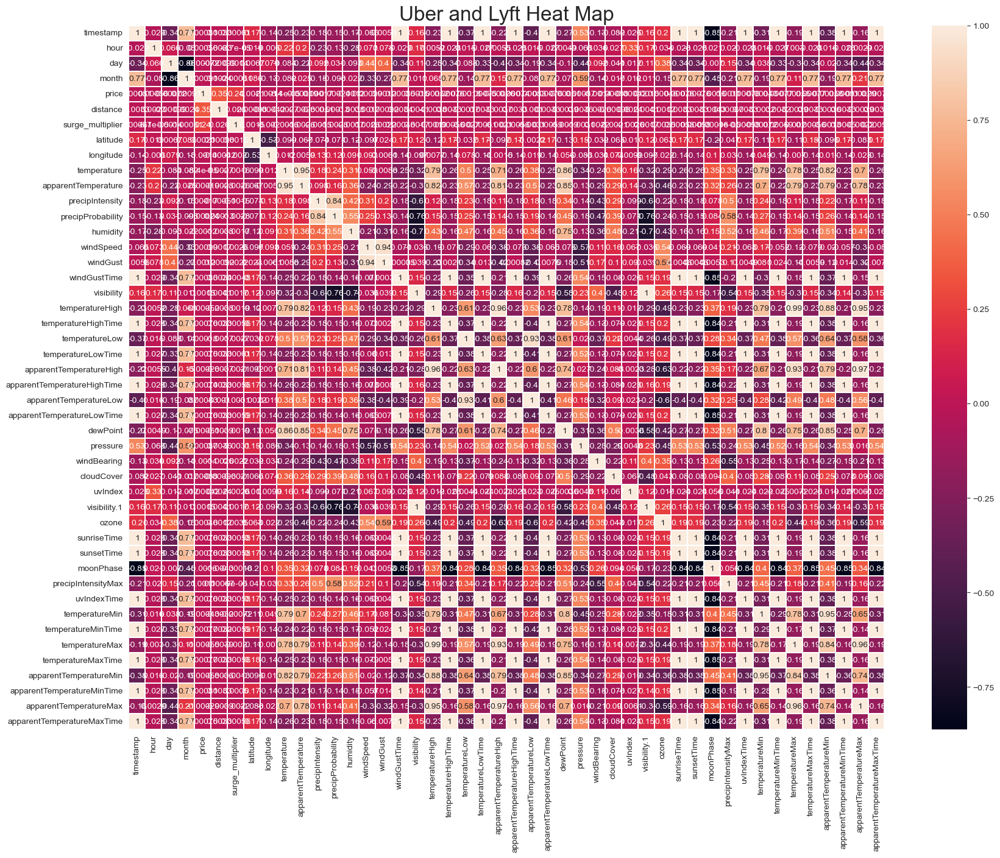

In [72]:
corrmat = df.corr()

fig, ax = plt.subplots(figsize=(20,15))
title = "Uber and Lyft Heat Map"
plt.title(title,fontsize=24)
ttl = ax.title
ttl.set_position([0.5,1.05])
sns.heatmap(corrmat,annot=True,linewidths=0.20,ax=ax)

## Feature Selection

In [73]:
new_df = df.drop(['id','timestamp','datetime','long_summary','apparentTemperatureHighTime','apparentTemperatureLowTime',
                  'apparentTemperatureLowTime','windGustTime','sunriseTime','sunsetTime','uvIndexTime','temperatureMinTime',
                 'temperatureMaxTime','apparentTemperatureMinTime','temperatureLowTime','apparentTemperatureMaxTime'],axis=1)

In [74]:
new_df.shape

(637976, 43)

In [75]:
new_df.columns

Index(['hour', 'day', 'month', 'timezone', 'source', 'destination', 'cab_type',
       'product_id', 'name', 'price', 'distance', 'surge_multiplier',
       'latitude', 'longitude', 'temperature', 'apparentTemperature',
       'short_summary', 'precipIntensity', 'precipProbability', 'humidity',
       'windSpeed', 'windGust', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'apparentTemperatureHigh',
       'apparentTemperatureLow', 'icon', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'visibility.1', 'ozone', 'moonPhase',
       'precipIntensityMax', 'temperatureMin', 'temperatureMax',
       'apparentTemperatureMin', 'apparentTemperatureMax', 'daytime'],
      dtype='object')

In [76]:
new_df.drop(['timezone'], axis=1, inplace=True)

In [77]:
new_df.columns

Index(['hour', 'day', 'month', 'source', 'destination', 'cab_type',
       'product_id', 'name', 'price', 'distance', 'surge_multiplier',
       'latitude', 'longitude', 'temperature', 'apparentTemperature',
       'short_summary', 'precipIntensity', 'precipProbability', 'humidity',
       'windSpeed', 'windGust', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'apparentTemperatureHigh',
       'apparentTemperatureLow', 'icon', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'visibility.1', 'ozone', 'moonPhase',
       'precipIntensityMax', 'temperatureMin', 'temperatureMax',
       'apparentTemperatureMin', 'apparentTemperatureMax', 'daytime'],
      dtype='object')

In [78]:
df.product_id.nunique()

12

In [79]:
df.product_id.unique()

array(['lyft_line', 'lyft_premier', 'lyft', 'lyft_luxsuv', 'lyft_plus',
       'lyft_lux', '6f72dfc5-27f1-42e8-84db-ccc7a75f6969',
       '6c84fd89-3f11-4782-9b50-97c468b19529',
       '55c66225-fbe7-4fd5-9072-eab1ece5e23e',
       '9a0e7b09-b92b-4c41-9779-2ad22b4d779d',
       '6d318bcc-22a3-4af6-bddd-b409bfce1546',
       '997acbb5-e102-41e1-b155-9df7de0a73f2'], dtype=object)

In [80]:
new_df.drop(['product_id'], axis=1, inplace=True)

In [81]:
temp_cols= ['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax','price']

In [82]:
df_temp = new_df[temp_cols]
df_temp.head()

,temperature,apparentTemperature,temperatureHigh,temperatureLow,apparentTemperatureHigh,apparentTemperatureLow,temperatureMin,temperatureHighTime,temperatureMax,apparentTemperatureMin,apparentTemperatureMax,price
0,42.34,37.12,43.68,34.19,37.95,27.39,39.89,1544968800,43.68,33.73,38.07,5.0
1,43.58,37.35,47.30,42.10,43.92,36.20,40.49,1543251600,47.30,36.20,43.92,11.0
2,38.33,32.93,47.55,33.10,44.12,29.11,35.36,1543320000,47.55,31.04,44.12,7.0
3,34.38,29.63,45.03,28.90,38.53,26.20,34.67,1543510800,45.03,30.30,38.53,26.0
4,37.44,30.88,42.18,36.71,35.75,30.29,33.10,1543420800,42.18,29.11,35.75,9.0


<AxesSubplot:>

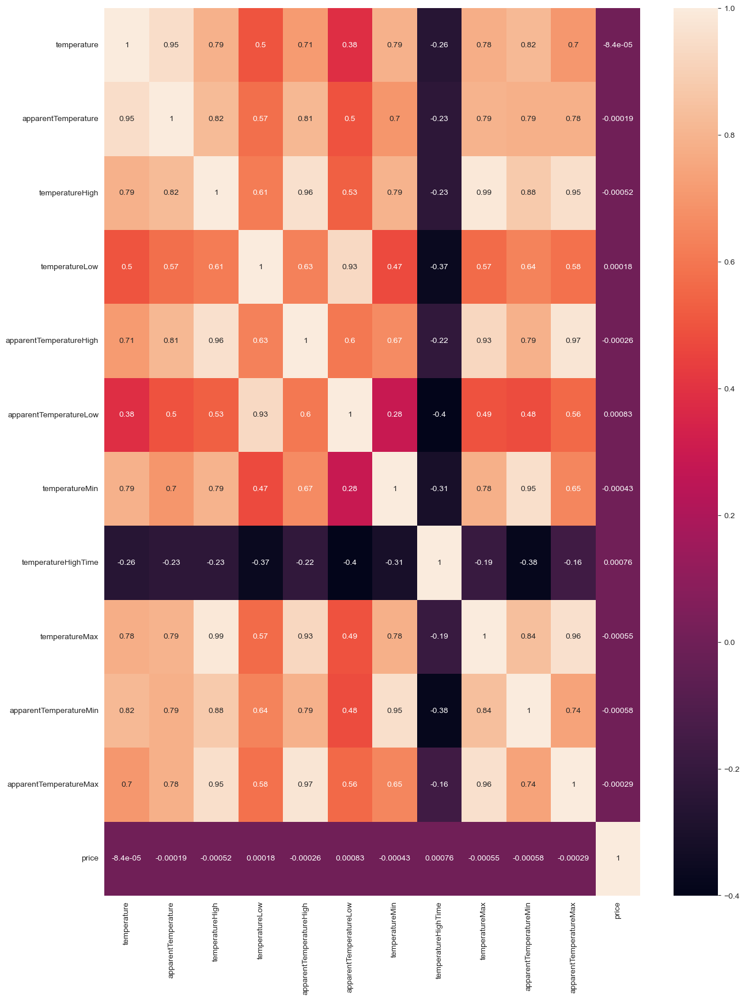

In [83]:
plt.figure(figsize=(15,20))
sns.heatmap(df_temp.corr(),annot=True)

In [84]:
new_df = new_df.drop(['temperature','apparentTemperature','temperatureHigh','temperatureLow','apparentTemperatureHigh',
                'apparentTemperatureLow','temperatureMin','temperatureHighTime','temperatureMax','apparentTemperatureMin','apparentTemperatureMax'],axis=1)
new_df.shape

(637976, 30)

In [85]:
climate_column = ['precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax','price']
df_clim = new_df[climate_column]
df_clim.head()

,precipIntensity,precipProbability,humidity,windSpeed,windGust,visibility,dewPoint,pressure,windBearing,cloudCover,uvIndex,ozone,moonPhase,precipIntensityMax,price
0,0.0000,0.0,0.68,8.66,9.17,10.000,32.70,1021.98,57,0.72,0,303.8,0.30,0.1276,5.0
1,0.1299,1.0,0.94,11.98,11.98,4.786,41.83,1003.97,90,1.00,0,291.1,0.64,0.1300,11.0
2,0.0000,0.0,0.75,7.33,7.33,10.000,31.10,992.28,240,0.03,0,315.7,0.68,0.1064,7.0
3,0.0000,0.0,0.73,5.28,5.28,10.000,26.64,1013.73,310,0.00,0,291.1,0.75,0.0000,26.0
4,0.0000,0.0,0.70,9.14,9.14,10.000,28.61,998.36,303,0.44,0,347.7,0.72,0.0001,9.0


<AxesSubplot:>

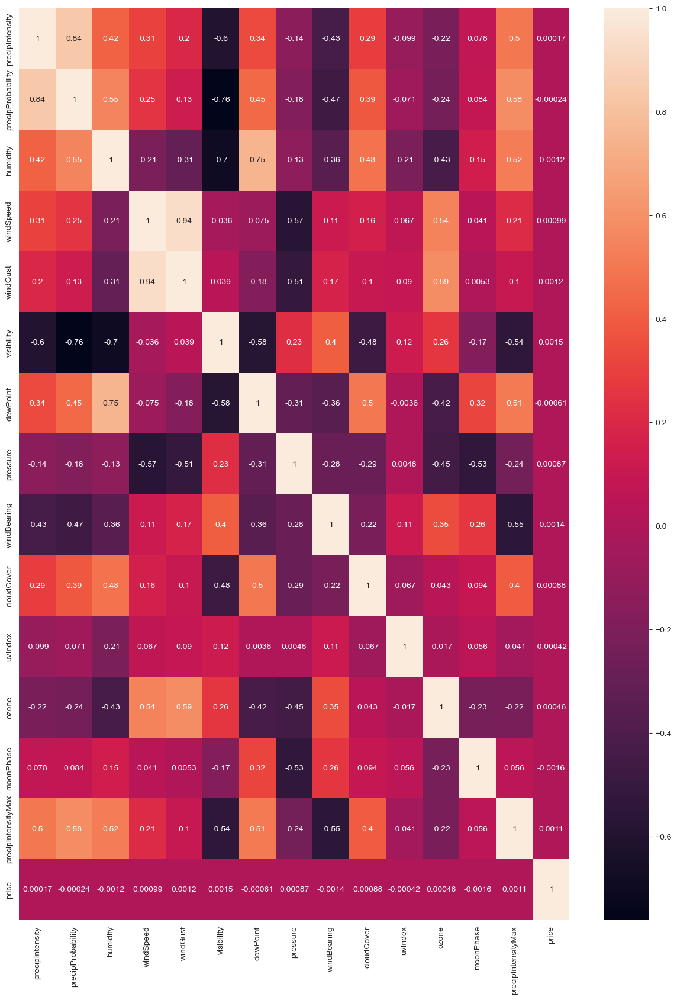

In [86]:
plt.figure(figsize=(15,20))
sns.heatmap(df_clim.corr(),annot=True)

In [87]:
new_df = new_df.drop(['precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'visibility', 'dewPoint', 'pressure', 'windBearing',
       'cloudCover', 'uvIndex', 'ozone', 'moonPhase',
       'precipIntensityMax'],axis=1)
new_df.shape

(637976, 16)

In [88]:
new_df.columns

Index(['hour', 'day', 'month', 'source', 'destination', 'cab_type', 'name',
       'price', 'distance', 'surge_multiplier', 'latitude', 'longitude',
       'short_summary', 'icon', 'visibility.1', 'daytime'],
      dtype='object')

In [89]:
new_df[['latitude','longitude']] = df[['latitude','longitude']]

In [90]:
new_df.shape

(637976, 16)

In [91]:
new_df.columns

Index(['hour', 'day', 'month', 'source', 'destination', 'cab_type', 'name',
       'price', 'distance', 'surge_multiplier', 'latitude', 'longitude',
       'short_summary', 'icon', 'visibility.1', 'daytime'],
      dtype='object')

In [92]:
new_df.surge_multiplier.nunique()

7

In [93]:
new_cat = ['source',
 'destination',
 'cab_type',
 'name',
 'short_summary',
 'icon','price']

df_cat = new_df[new_cat]
df_cat.head()

,source,destination,cab_type,name,short_summary,icon,price
0,Haymarket Square,North Station,Lyft,Shared,Mostly Cloudy,partly-cloudy-night,5.0
1,Haymarket Square,North Station,Lyft,Lux,Rain,rain,11.0
2,Haymarket Square,North Station,Lyft,Lyft,Clear,clear-night,7.0
3,Haymarket Square,North Station,Lyft,Lux Black XL,Clear,clear-night,26.0
4,Haymarket Square,North Station,Lyft,Lyft XL,Partly Cloudy,partly-cloudy-night,9.0


In [94]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

df_cat_encode= df_cat.copy()
for col in df_cat_encode.select_dtypes(include='O').columns:
    df_cat_encode[col]=le.fit_transform(df_cat_encode[col])

<AxesSubplot:>

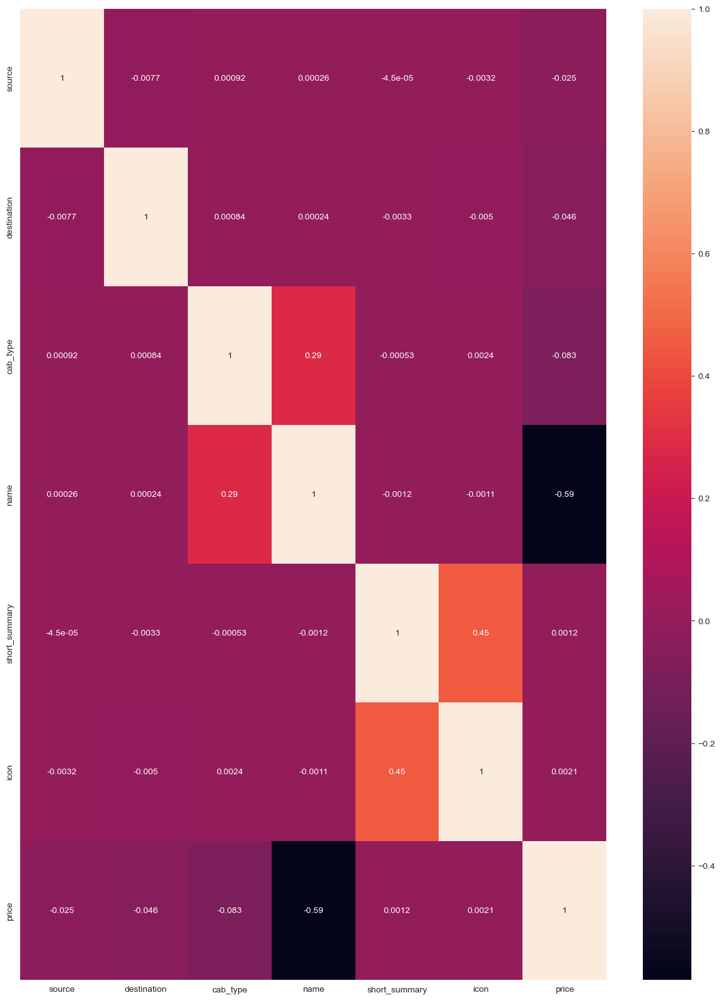

In [95]:
plt.figure(figsize=(15,20))
sns.heatmap(df_cat_encode.corr(),annot=True)

In [96]:
new_df = new_df.drop(['source','destination','short_summary','icon'],axis=1)
new_df.head()

,hour,day,month,cab_type,name,price,distance,surge_multiplier,latitude,longitude,visibility.1,daytime
0,9,16,12,Lyft,Shared,5.0,0.44,1.0,42.2148,-71.033,10.000,Morning
1,2,27,11,Lyft,Lux,11.0,0.44,1.0,42.2148,-71.033,4.786,Morning
2,1,28,11,Lyft,Lyft,7.0,0.44,1.0,42.2148,-71.033,10.000,Morning
3,4,30,11,Lyft,Lux Black XL,26.0,0.44,1.0,42.2148,-71.033,10.000,Morning
4,3,29,11,Lyft,Lyft XL,9.0,0.44,1.0,42.2148,-71.033,10.000,Morning


In [97]:
new_df = new_df.drop(['hour','day','month','latitude','longitude'],axis=1)
new_df.head()

,cab_type,name,price,distance,surge_multiplier,visibility.1,daytime
0,Lyft,Shared,5.0,0.44,1.0,10.000,Morning
1,Lyft,Lux,11.0,0.44,1.0,4.786,Morning
2,Lyft,Lyft,7.0,0.44,1.0,10.000,Morning
3,Lyft,Lux Black XL,26.0,0.44,1.0,10.000,Morning
4,Lyft,Lyft XL,9.0,0.44,1.0,10.000,Morning


### Data Encoding

In [98]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 637976 entries, 0 to 693070
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   cab_type          637976 non-null  object  
 1   name              637976 non-null  object  
 2   price             637976 non-null  float64 
 3   distance          637976 non-null  float64 
 4   surge_multiplier  637976 non-null  float64 
 5   visibility.1      637976 non-null  float64 
 6   daytime           608104 non-null  category
dtypes: category(1), float64(4), object(2)
memory usage: 50.8+ MB


In [99]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder()
new_df[['cab_type','name', 'daytime']] = enc.fit_transform(new_df[['cab_type','name', 'daytime']])

ValueError: Columns must be same length as key

In [100]:
new_df.columns

Index(['cab_type', 'name', 'price', 'distance', 'surge_multiplier',
       'visibility.1', 'daytime'],
      dtype='object')

In [101]:
new_df.drop(['visibility.1', 'daytime'], axis=1, inplace=True)

In [103]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
new_df[['cab_type','name']] = encoder.fit_transform(new_df[['cab_type','name']])

### Dataset Split

In [105]:
from sklearn.model_selection import train_test_split
X = new_df.drop(columns=['price'],axis=1).values
y = new_df['price'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

## Building Models and Training

### Linear Regression

In [137]:
from sklearn.linear_model import LinearRegression
mlr_model = LinearRegression()
mlr_model.fit(X_train, y_train)

LinearRegression()

In [138]:
mlr_model.score(X_train, y_train),mlr_model.score(X_test, y_test)

(0.5140189011112071, 0.5140180298049016)

In [139]:
mlr_pred = mlr_model.predict(X_test)

### SGD Regressor

In [140]:
from sklearn.linear_model import SGDRegressor
sgd_regressor = SGDRegressor(alpha = 0.001)
sgd_regressor.fit(X_train, y_train)

SGDRegressor(alpha=0.001)

In [141]:
sgd_regressor.score(X_train, y_train),sgd_regressor.score(X_test, y_test)

(0.5132251713371965, 0.51327621383689)

In [142]:
sgd_pred = sgd_regressor.predict(X_test)

### Regularization

In [143]:
from sklearn.linear_model import Lasso
regressor = Lasso(alpha = 1)
regressor.fit(X_train, y_train)

print('Training Set Score : ', regressor.score(X_train, y_train))
print('Testng Set Score   : ', regressor.score(X_test, y_test))

lasso_pred = regressor.predict(X_test)

Training Set Score :  0.4528009580730098
Testng Set Score   :  0.45589896974612754


In [144]:
from sklearn.linear_model import Ridge
ridge_regressor = Ridge(alpha = 1)
ridge_regressor.fit(X_train, y_train)

print('Training Set Score : ', ridge_regressor.score(X_train, y_train))
print('Testng Set Score   : ', ridge_regressor.score(X_test, y_test))

ridge_pred = ridge_regressor.predict(X_test)

Training Set Score :  0.51401889839233
Testng Set Score   :  0.5140181770471046


In [145]:
from sklearn.linear_model import ElasticNet
el_regressor = ElasticNet(alpha = 1)
el_regressor.fit(X_train, y_train)

print('Training Set Score : ', el_regressor.score(X_train, y_train))
print('Testng Set Score   : ', el_regressor.score(X_test, y_test))

el_pred = el_regressor.predict(X_test)

Training Set Score :  0.44416438078113996
Testng Set Score   :  0.4473522694836437


### KNN Regressor

In [146]:
from sklearn.neighbors import KNeighborsRegressor
regressor = KNeighborsRegressor(n_neighbors = 5)
regressor.fit(X_train, y_train)

print('Training Set Score : ', regressor.score(X_train, y_train))
print('Testng Set Score   : ', regressor.score(X_test, y_test))

knn_pred = regressor.predict(X_test)

Training Set Score :  0.960217776629069
Testng Set Score   :  0.9589641857681658


### Decision Trees

In [147]:
from sklearn.tree import DecisionTreeRegressor
decision_regressor = DecisionTreeRegressor(max_depth=6)
decision_regressor.fit(X_train,y_train)

dt_pred = decision_regressor.predict(X_test)

In [148]:
decision_regressor.score(X_train, y_train),decision_regressor.score(X_test, y_test)

(0.9311963082962464, 0.9316867796203536)

### Random Forest Regression

In [149]:
from sklearn.ensemble import RandomForestRegressor
randomForest_regressor = RandomForestRegressor(n_estimators=100,max_depth=6)
randomForest_regressor.fit(X_train,y_train)

print ('Training Set Score print',randomForest_regressor.score(X_train, y_train)) 
print ('Test Set Score print',randomForest_regressor.score(X_test, y_test)) 

rf_pred = randomForest_regressor.predict(X_test)

Training Set Score print 0.9320339821214406
Test Set Score print 0.9325539897733621


### XGBoost

In [150]:
from xgboost import XGBRegressor
xgb_regressor = XGBRegressor(n_estimators=250, max_depth=5)
xgb_regressor.fit(X_train,y_train)

print ('Training Set Score print',xgb_regressor.score(X_train, y_train)) 
print ('Test Set Score print',xgb_regressor.score(X_test, y_test)) 

xgb_pred = xgb_regressor.predict(X_test)

Training Set Score print 0.9664020939898667
Test Set Score print 0.9660675783514683


## Comparing Predictions

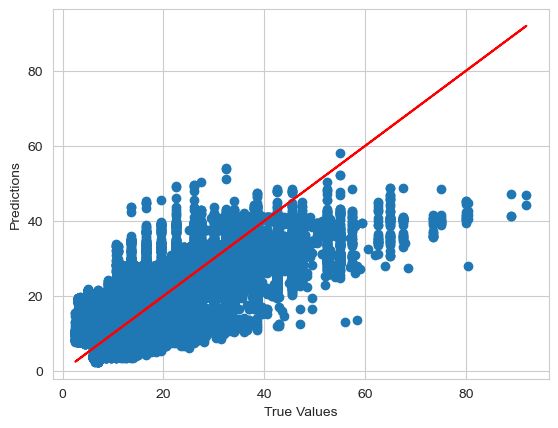

In [153]:
plt.scatter(y_test, mlr_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

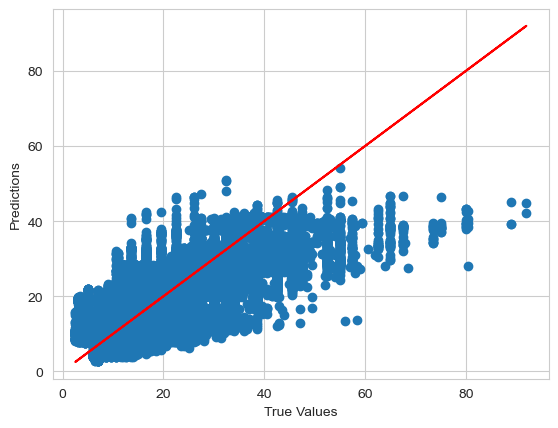

In [154]:
plt.scatter(y_test, sgd_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

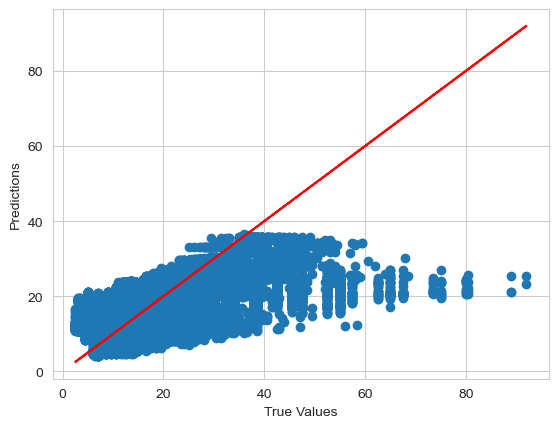

In [155]:
plt.scatter(y_test, lasso_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

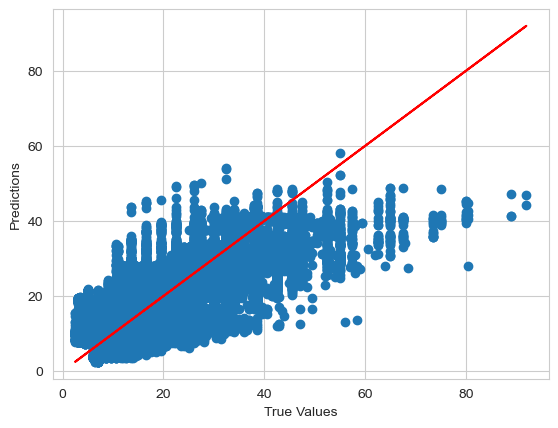

In [156]:
plt.scatter(y_test, ridge_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

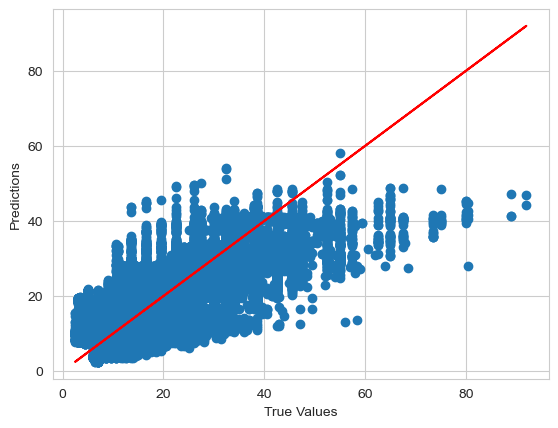

In [157]:
plt.scatter(y_test, ridge_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

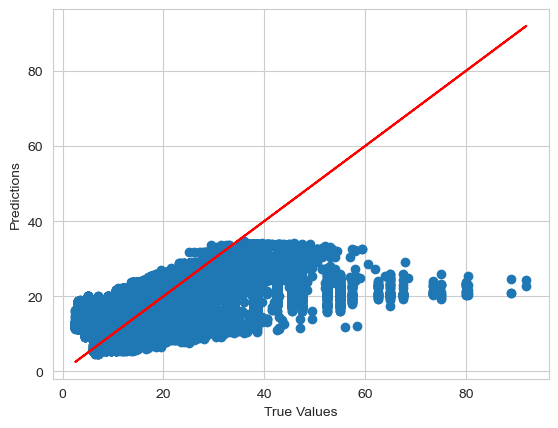

In [158]:
plt.scatter(y_test, el_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

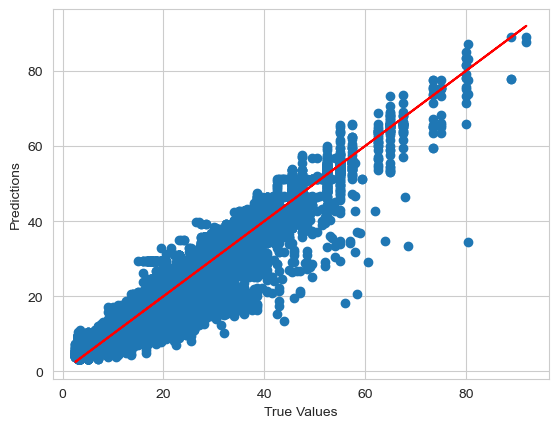

In [159]:
plt.scatter(y_test, knn_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

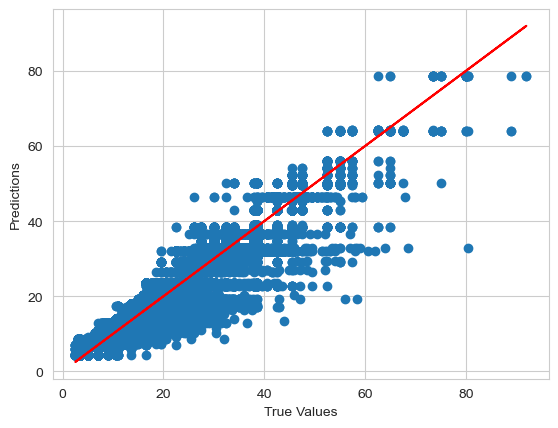

In [160]:
plt.scatter(y_test, dt_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

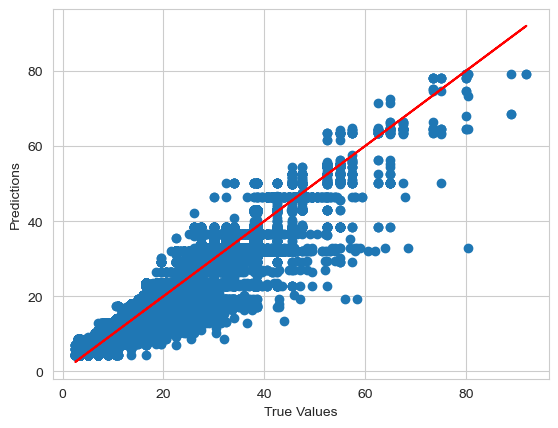

In [161]:
plt.scatter(y_test, rf_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

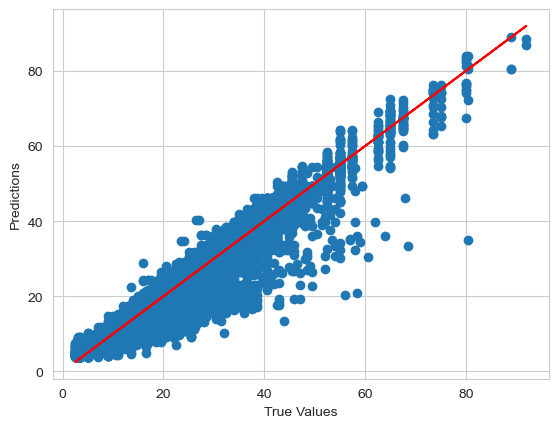

In [162]:
plt.scatter(y_test, xgb_pred)
plt.plot(y_test, y_test, color='red') # plotting the y=x line for reference
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

## Regression Evaluation Metrics

#### MAE

In [165]:
from sklearn.metrics import mean_absolute_error
print("MLR MAE: ",mean_absolute_error(y_test,mlr_pred))
print("Lasso MAE: ",mean_absolute_error(y_test,lasso_pred))
print("SGD MAE: ",mean_absolute_error(y_test,sgd_pred))
print("Ridge MAE: ",mean_absolute_error(y_test,ridge_pred))
print("ElasticNet MAE: ",mean_absolute_error(y_test,el_pred))
print("KNN MAE: ",mean_absolute_error(y_test,knn_pred))
print("Decision Tree MAE: ",mean_absolute_error(y_test,dt_pred))
print("Random Forest MAE: ",mean_absolute_error(y_test,rf_pred))
print("XGB MAE: ",mean_absolute_error(y_test,xgb_pred))

MLR MAE:  5.160792432989188
Lasso MAE:  5.393377914479155
SGD MAE:  5.16825856472215
Ridge MAE:  5.160793671246389
ElasticNet MAE:  5.42378656274524
KNN MAE:  1.2380875998599739
Decision Tree MAE:  1.5763036138464182
Random Forest MAE:  1.5645643796885447
XGB MAE:  1.1277928659279408


#### MSE

In [166]:
from sklearn.metrics import mean_squared_error
print("MLR MSE: ",mean_squared_error(y_test,mlr_pred))
print("Lasso MSE: ",mean_squared_error(y_test,lasso_pred))
print("SGD MSE: ",mean_squared_error(y_test,sgd_pred))
print("Ridge MSE: ",mean_squared_error(y_test,ridge_pred))
print("ElasticNet MSE: ",mean_squared_error(y_test,el_pred))
print("KNN MSE: ",mean_squared_error(y_test,knn_pred))
print("Decision Tree MSE: ",mean_squared_error(y_test,dt_pred))
print("Random Forest MSE: ",mean_squared_error(y_test,rf_pred))
print("XGB MSE: ",mean_squared_error(y_test,xgb_pred))

MLR MAE:  41.921044239026095
Lasso MAE:  46.934423000539375
SGD MAE:  41.98503364999076
Ridge MAE:  41.92103153784111
ElasticNet MAE:  47.67166557696139
KNN MAE:  3.539769557925316
Decision Tree MAE:  5.892732054433694
Random Forest MAE:  5.81792607927744
XGB MAE:  2.9270274131658174


#### RMSE

In [168]:
from sklearn.metrics import mean_squared_error
print("MLR RMSE: ",np.sqrt(mean_squared_error(y_test,mlr_pred)))
print("Lasso RMSE: ",np.sqrt(mean_squared_error(y_test,lasso_pred)))
print("SGD RMSE: ",np.sqrt(mean_squared_error(y_test,sgd_pred)))
print("Ridge RMSE: ",np.sqrt(mean_squared_error(y_test,ridge_pred)))
print("ElasticNet RMSE: ",np.sqrt(mean_squared_error(y_test,el_pred)))
print("KNN RMSE: ",np.sqrt(mean_squared_error(y_test,knn_pred)))
print("Decision Tree RMSE: ",np.sqrt(mean_squared_error(y_test,dt_pred)))
print("Random Forest RMSE: ",np.sqrt(mean_squared_error(y_test,rf_pred)))
print("XGB RMSE: ",np.sqrt(mean_squared_error(y_test,xgb_pred)))

MLR RMSE:  6.474646263621365
Lasso RMSE:  6.850870236731928
SGD RMSE:  6.479585916552906
Ridge RMSE:  6.47464528278122
ElasticNet RMSE:  6.904467074073232
KNN RMSE:  1.8814275319356086
Decision Tree RMSE:  2.427495016356098
Random Forest RMSE:  2.4120377441651777
XGB RMSE:  1.7108557546344512


### r2 score

In [171]:
from sklearn.metrics import r2_score

print("MLR r2_score: ",r2_score(y_test,mlr_pred))
print("SGD r2_score: ",r2_score(y_test,sgd_pred))
print("Lasso r2_score: ",r2_score(y_test,lasso_pred))
print("Ridge r2_score: ",r2_score(y_test,ridge_pred))
print("ElasticNet r2_score: ",r2_score(y_test,el_pred))
print("KNN r2_score: ",r2_score(y_test,knn_pred))
print("Decision Tree r2_score: ",r2_score(y_test,dt_pred))
print("Random Forest r2_score: ",r2_score(y_test,rf_pred))
print("XGB r2_score: ",r2_score(y_test,xgb_pred))


MLR r2_score:  0.5140180298049016
SGD r2_score:  0.51327621383689
Lasso r2_score:  0.45589896974612754
Ridge r2_score:  0.5140181770471046
ElasticNet r2_score:  0.4473522694836437
KNN r2_score:  0.9589641857681658
Decision Tree r2_score:  0.9316867796203536
Random Forest r2_score:  0.9325539897733621
XGB r2_score:  0.9660675783514683
